In [1]:
import pandas as pd
import numpy as np

df = pd.read_csv("Training.csv")
print(df.head())

   itching  skin_rash  nodal_skin_eruptions  continuous_sneezing  shivering  \
0        1          1                     1                    0          0   
1        0          1                     1                    0          0   
2        1          0                     1                    0          0   
3        1          1                     0                    0          0   
4        1          1                     1                    0          0   

   chills  joint_pain  stomach_pain  acidity  ulcers_on_tongue  ...  \
0       0           0             0        0                 0  ...   
1       0           0             0        0                 0  ...   
2       0           0             0        0                 0  ...   
3       0           0             0        0                 0  ...   
4       0           0             0        0                 0  ...   

   blackheads  scurring  skin_peeling  silver_like_dusting  \
0           0         0             

In [162]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import train_test_split

import pickle
dfnew1 = pd.read_csv('cleaned_dataset.csv')

# X = df.iloc[:, :-1]  # All columns except the last one
# y = df.iloc[:, -1]   # The last column (prognosis)
# Split into training and test sets
X = dfnew1.iloc[:, :-1]  # All columns except the last one
y = dfnew1.iloc[:, -1] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Gradient Boosting Classifier
model = GradientBoostingClassifier()
model1 = RandomForestClassifier()
model.fit(X_train, y_train)
model1.fit(X_train, y_train)


accuracy = model.score(X_test, y_test)
accuracy1 = model1.score(X_test, y_test)
print("Model Accuracy: ", accuracy)
print("Model Accuracy: ", accuracy1)

with open('trained_model_random.pkl', 'wb') as file:
    pickle.dump(model1, file)

with open('trained_model_gradient.pkl', 'wb') as file:
    pickle.dump(model, file)

# Get feature importances
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the top 10 important features
top_features = X.columns[indices[:20]].tolist()
print("Top 10 features:", top_features)

Model Accuracy:  0.8360655737704918
Model Accuracy:  1.0
Top 10 features: ['belly_pain', 'blood_in_sputum', 'pain_behind_the_eyes', 'swelling_of_stomach', 'rusty_sputum', 'itching', 'weight_loss', 'ulcers_on_tongue', 'knee_pain', 'stomach_bleeding', 'throat_irritation', 'receiving_unsterile_injections', 'muscle_pain', 'dark_urine', 'muscle_weakness', 'slurred_speech', 'yellowish_skin', 'increased_appetite', 'visual_disturbances', 'movement_stiffness']


In [3]:
print(pd.options.display.max_rows)

60


In [5]:
print(df.head(10))
print(df.tail())

   itching  skin_rash  nodal_skin_eruptions  continuous_sneezing  shivering  \
0        1          1                     1                    0          0   
1        0          1                     1                    0          0   
2        1          0                     1                    0          0   
3        1          1                     0                    0          0   
4        1          1                     1                    0          0   
5        0          1                     1                    0          0   
6        1          0                     1                    0          0   
7        1          1                     0                    0          0   
8        1          1                     1                    0          0   
9        1          1                     1                    0          0   

   chills  joint_pain  stomach_pain  acidity  ulcers_on_tongue  ...  \
0       0           0             0        0               

In [6]:
print(df.tail())

      itching  skin_rash  nodal_skin_eruptions  continuous_sneezing  \
4915        0          0                     0                    0   
4916        0          1                     0                    0   
4917        0          0                     0                    0   
4918        0          1                     0                    0   
4919        0          1                     0                    0   

      shivering  chills  joint_pain  stomach_pain  acidity  ulcers_on_tongue  \
4915          0       0           0             0        0                 0   
4916          0       0           0             0        0                 0   
4917          0       0           0             0        0                 0   
4918          0       0           1             0        0                 0   
4919          0       0           0             0        0                 0   

      ...  blackheads  scurring  skin_peeling  silver_like_dusting  \
4915  ...           0 

In [7]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4920 entries, 0 to 4919
Columns: 133 entries, itching to prognosis
dtypes: int64(132), object(1)
memory usage: 5.0+ MB
None


In [8]:
df.dropna(inplace=True)
print(df.to_string())

      itching  skin_rash  nodal_skin_eruptions  continuous_sneezing  shivering  chills  joint_pain  stomach_pain  acidity  ulcers_on_tongue  muscle_wasting  vomiting  burning_micturition  spotting_urination  fatigue  weight_gain  anxiety  cold_hands_and_feets  mood_swings  weight_loss  restlessness  lethargy  patches_in_throat  irregular_sugar_level  cough  high_fever  sunken_eyes  breathlessness  sweating  dehydration  indigestion  headache  yellowish_skin  dark_urine  nausea  loss_of_appetite  pain_behind_the_eyes  back_pain  constipation  abdominal_pain  diarrhoea  mild_fever  yellow_urine  yellowing_of_eyes  acute_liver_failure  fluid_overload  swelling_of_stomach  swelled_lymph_nodes  malaise  blurred_and_distorted_vision  phlegm  throat_irritation  redness_of_eyes  sinus_pressure  runny_nose  congestion  chest_pain  weakness_in_limbs  fast_heart_rate  pain_during_bowel_movements  pain_in_anal_region  bloody_stool  irritation_in_anus  neck_pain  dizziness  cramps  bruising  obesit

In [9]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4920 entries, 0 to 4919
Columns: 133 entries, itching to prognosis
dtypes: int64(132), object(1)
memory usage: 5.0+ MB
None


In [10]:
print(df.duplicated())

0       False
1       False
2       False
3       False
4       False
        ...  
4915     True
4916     True
4917     True
4918     True
4919     True
Length: 4920, dtype: bool


In [11]:
df.drop_duplicates(inplace=True)

In [12]:
print(df.duplicated())

0      False
1      False
2      False
3      False
4      False
       ...  
402    False
403    False
405    False
406    False
407    False
Length: 304, dtype: bool


In [13]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 304 entries, 0 to 407
Columns: 133 entries, itching to prognosis
dtypes: int64(132), object(1)
memory usage: 318.2+ KB
None


In [14]:
print(df.to_string())

     itching  skin_rash  nodal_skin_eruptions  continuous_sneezing  shivering  chills  joint_pain  stomach_pain  acidity  ulcers_on_tongue  muscle_wasting  vomiting  burning_micturition  spotting_urination  fatigue  weight_gain  anxiety  cold_hands_and_feets  mood_swings  weight_loss  restlessness  lethargy  patches_in_throat  irregular_sugar_level  cough  high_fever  sunken_eyes  breathlessness  sweating  dehydration  indigestion  headache  yellowish_skin  dark_urine  nausea  loss_of_appetite  pain_behind_the_eyes  back_pain  constipation  abdominal_pain  diarrhoea  mild_fever  yellow_urine  yellowing_of_eyes  acute_liver_failure  fluid_overload  swelling_of_stomach  swelled_lymph_nodes  malaise  blurred_and_distorted_vision  phlegm  throat_irritation  redness_of_eyes  sinus_pressure  runny_nose  congestion  chest_pain  weakness_in_limbs  fast_heart_rate  pain_during_bowel_movements  pain_in_anal_region  bloody_stool  irritation_in_anus  neck_pain  dizziness  cramps  bruising  obesity

In [17]:
print(df.corr(numeric_only=True))

                       itching  skin_rash  nodal_skin_eruptions  \
itching               1.000000   0.260536              0.207941   
skin_rash             0.260536   1.000000              0.204742   
nodal_skin_eruptions  0.207941   0.204742              1.000000   
continuous_sneezing  -0.080041  -0.081166             -0.023408   
shivering            -0.045591  -0.046232             -0.013333   
...                        ...        ...                   ...   
small_dents_in_nails -0.056025   0.285864             -0.016385   
inflammatory_nails   -0.056025   0.285864             -0.016385   
blister              -0.051058   0.248029             -0.014932   
red_sore_around_nose -0.051058   0.248029             -0.014932   
yellow_crust_ooze    -0.051058   0.248029             -0.014932   

                      continuous_sneezing  shivering    chills  joint_pain  \
itching                         -0.080041  -0.045591 -0.181433   -0.166718   
skin_rash                       -0.0811

In [18]:
print(df.corr(numeric_only=True))

                       itching  skin_rash  nodal_skin_eruptions  \
itching               1.000000   0.260536              0.207941   
skin_rash             0.260536   1.000000              0.204742   
nodal_skin_eruptions  0.207941   0.204742              1.000000   
continuous_sneezing  -0.080041  -0.081166             -0.023408   
shivering            -0.045591  -0.046232             -0.013333   
...                        ...        ...                   ...   
small_dents_in_nails -0.056025   0.285864             -0.016385   
inflammatory_nails   -0.056025   0.285864             -0.016385   
blister              -0.051058   0.248029             -0.014932   
red_sore_around_nose -0.051058   0.248029             -0.014932   
yellow_crust_ooze    -0.051058   0.248029             -0.014932   

                      continuous_sneezing  shivering    chills  joint_pain  \
itching                         -0.080041  -0.045591 -0.181433   -0.166718   
skin_rash                       -0.0811

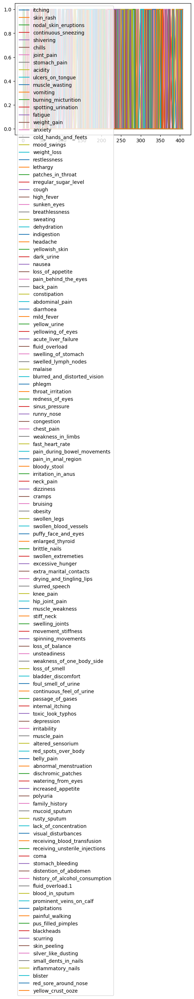

In [20]:
import matplotlib.pyplot as plt

df.plot()

plt.show()

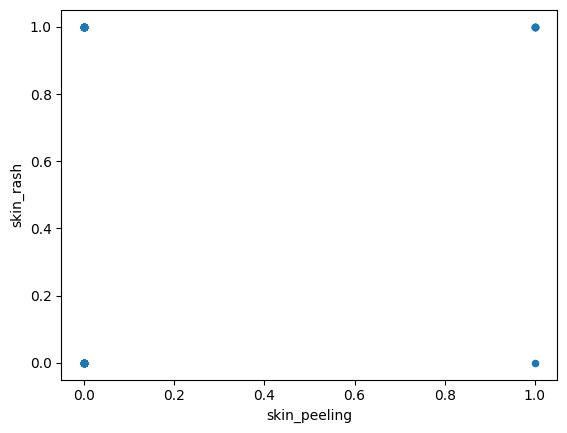

In [24]:
df.plot(kind='scatter', x='skin_peeling', y='skin_rash')
plt.show()

<Axes: ylabel='Frequency'>

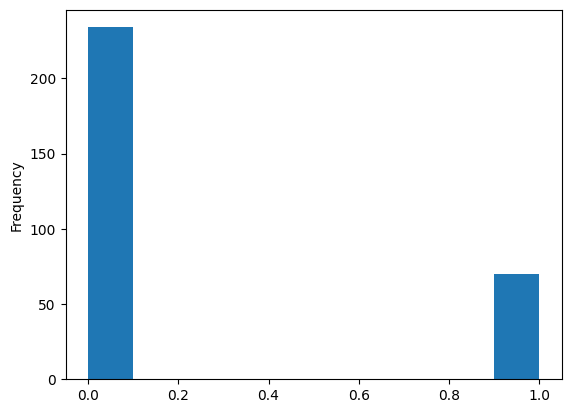

In [26]:
df['abdominal_pain'].plot(kind='hist')

In [27]:
X = df.iloc[:, :-1]
y = df.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = GradientBoostingClassifier()
model.fit(X_train, y_train)

importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

top_features = X.columns[indices[:10]].tolist()
print("Top 10 features", top_features)

Top 10 features ['blood_in_sputum', 'swelling_of_stomach', 'pain_behind_the_eyes', 'rusty_sputum', 'belly_pain', 'weight_loss', 'ulcers_on_tongue', 'muscle_pain', 'sinus_pressure', 'mild_fever']


In [44]:
def search_parameters(search_query, feature_names):
    return [feature for feature in feature_names if search_query.lower() in feature.lower()]

search_query = 'back'
search_results = search_parameters(search_query, X.columns)
print("Search results", search_results)

Search results ['back_pain']


In [47]:
import os

directory = '../notebook'
filename = 'cleaned_dataset.csv'
filename_pkl = 'cleaned_dataset.pkl'
os.makedirs(directory, exist_ok=True)
file_path = os.path.join(directory, filename)
file_path_pkl = os.path.join(directory, filename_pkl)
df.to_csv(file_path, index=False)
df.to_pickle(file_path_pkl)
print(f"Dataframe save to '{file_path}'")
print(f"Datafram save to '{file_path_pkl}'")

Dataframe save to '../notebook/cleaned_dataset.csv'
Datafram save to '../notebook/cleaned_dataset.pkl'


In [48]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 304 entries, 0 to 407
Columns: 133 entries, itching to prognosis
dtypes: int64(132), object(1)
memory usage: 318.2+ KB
None


In [49]:
def search_parameters(search_query, feature_names):
    return [feature for feature in feature_names if search_query.lower() in feature.lower()]

search_query = 'nose'
search_results = search_parameters(search_query, X.columns)
print("Search results", search_results)

Search results ['runny_nose', 'red_sore_around_nose']


In [52]:
def get_user_response(question):
    return np.random.choice([0, 1])

def select_next_question(model, X_unanswered, answered_questions, answered_values ):
    mask = np.ones(X_unanswered.shape[1], dtype=bool)
    mask[answered_questions] = False

    uncertainties = []

    for question in range(X_unanswered.shape[1]):
        if mask[question]:
            X_temp = X_unanswered.copy()
            for q, v in zip(answered_questions, answered_values):
                X_temp[:, q] = v
            uncertainties.append(np.var(model.predict(X_temp)))
        else:
            uncertainties.append(-1)
            
    # for question, value in zip(answered_questions, answered_values):
    #     X_unanswered[:, question] = value

    #     for question in range(X_unanswered.shape[1]):
    #         if question not in answered_questions:
    #             X_temp = X_unanswered.copy()
    #             uncertainties.append(np.var(model.predict(X_temp)))

        next_question = np.argmax(uncertainties)
        return next_question
    
answered_questions = []
answered_values = []

for question in indices[:10]:
    user_response = get_user_response(question)
    answered_questions.append(question)
    answered_values.append(user_response)

    next_question = select_next_question(model, X, answered_questions, answered_values)
    print(f"Next queston to ask: {X.columns[next_question]}")

TypeError: Index does not support mutable operations

In [63]:
#simulate a user search
def search_parameters(search_query, feature_names):
    return [feature for feature in feature_names if search_query.lower() in feature.lower()]

search_query = 'back'
search_results = search_parameters(search_query, X.columns)
print("Search results", search_results)


def get_response(user_input):
    if user_input in X.columns:
        return 1
    return 0

user_input = 'back_pain'
get_response(user_input)


Search results ['back_pain']


1

In [74]:
dfnew = pd.read_csv('cleaned_dataset.csv')
def check_valid_rows(col):
    col = col
    count = 0
    for row in dfnew[col]:
        if row == 1:
           count += 1
    print(count)
        # return "Yes" 
col = "chest_pain"
check_valid_rows(col)

42


In [73]:
dfnew = pd.read_csv('cleaned_dataset.csv')
print(f"Shape of Dataframe: {dfnew.shape}")
print(dfnew['chest_pain'].value_counts())

Shape of Dataframe: (304, 133)
chest_pain
0    262
1     42
Name: count, dtype: int64


In [75]:
X = dfnew.iloc[:, :-1]  # All columns except the last one
y = dfnew.iloc[:, -1]   # The last column (prognosis)

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Gradient Boosting Classifier
model = GradientBoostingClassifier()
model.fit(X_train, y_train)

# Get feature importances
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the top 20 important features
top_features = X.columns[indices[:20]].tolist()
print("Top 10 features:", top_features)

Top 10 features: ['belly_pain', 'blood_in_sputum', 'swelling_of_stomach', 'pain_behind_the_eyes', 'rusty_sputum', 'weight_loss', 'ulcers_on_tongue', 'mild_fever', 'congestion', 'muscle_pain', 'hip_joint_pain', 'itching', 'dark_urine', 'polyuria', 'coma', 'receiving_unsterile_injections', 'palpitations', 'visual_disturbances', 'movement_stiffness', 'lack_of_concentration']


In [76]:
def count_rows_based_on_val(dfnew, column_name, val):
    return dfnew[dfnew[column_name] == val].shape[0]

column_name = 'chest_pain'
val = 1
count = count_rows_based_on_val(dfnew, column_name, val)
print(f"Number of rows where '{column_name} is {val}: {count}")

Number of rows where 'chest_pain is 1: 42


In [83]:
# def count_valid_rows(dfnew, primary_col):
def get_columns_with_one(dfnew, primary_col):
    filtered_df = dfnew[dfnew[primary_col] == 1]

    cols_with_one = filtered_df.drop(columns=[primary_col]).any(axis=0)
    cols_with_one = cols_with_one[cols_with_one].index.tolist()

    # valid_rows = filtered_df.drop(columns=[primary_col]).any(axis=1)
    # return valid_rows.sum()
    return cols_with_one

primary_column = 'back_pain'
columns_with_one = get_columns_with_one(dfnew, primary_column)
print(f"Columns with a value of 1 where '{primary_column}' is 1: {columns_with_one}")
# count = count_valid_rows(dfnew, primary_column)
# print(f"Number of rows where '{primary_column}' is 1 and any other column is also 1: {count}")

Columns with a value of 1 where 'back_pain' is 1: ['skin_rash', 'chills', 'joint_pain', 'vomiting', 'fatigue', 'high_fever', 'headache', 'nausea', 'loss_of_appetite', 'pain_behind_the_eyes', 'malaise', 'weakness_in_limbs', 'neck_pain', 'dizziness', 'loss_of_balance', 'muscle_pain', 'red_spots_over_body', 'prognosis']


In [ ]:
def get_top_n_features(df, primary_col, n=6):
    cols_with_one = get_columns_with_one(dfnew, primary_col)
    

In [190]:
from sklearn.feature_selection import SelectKBest, chi2

def get_top_n_features(df, primary_col, n=6):
    """
    Get the top N features (columns) based on their importance or relevance using the Chi-Squared test.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    primary_col (str): The primary column to check for a value of 1.
    n (int): The number of top features to select.

    Returns:
    list: List of top N features.
    """
    # Separate the features and the target variable
    X = df.drop(columns=[primary_col])
    y = df[primary_col]

    # Apply SelectKBest with the Chi-Squared test
    selector = SelectKBest(score_func=chi2, k=n)
    selector.fit(X, y)

    # Get the indices of the top features
    top_indices = selector.get_support(indices=True)

    # Get the column names of the top features
    top_features = X.columns[top_indices]
    return top_features.tolist()

# Example usage
primary_column = "coma"
top_features = get_top_n_features(df, primary_column, n=35)
top_features.append('prognosis')
print(f"Top 35 features to ask about where '{primary_column}' is 1: {top_features}")

# Save the top features to a list
top_features_list = top_features
print("Top features list:", top_features_list)


Top 35 features to ask about where 'coma' is 1: ['nodal_skin_eruptions', 'shivering', 'acidity', 'ulcers_on_tongue', 'muscle_wasting', 'anxiety', 'restlessness', 'irregular_sugar_level', 'dehydration', 'pain_behind_the_eyes', 'abdominal_pain', 'fluid_overload', 'blurred_and_distorted_vision', 'throat_irritation', 'redness_of_eyes', 'sinus_pressure', 'congestion', 'bloody_stool', 'neck_pain', 'dizziness', 'bruising', 'obesity', 'swollen_blood_vessels', 'slurred_speech', 'knee_pain', 'stiff_neck', 'loss_of_balance', 'weakness_of_one_body_side', 'receiving_blood_transfusion', 'stomach_bleeding', 'prominent_veins_on_calf', 'inflammatory_nails', 'blister', 'red_sore_around_nose', 'yellow_crust_ooze', 'prognosis']
Top features list: ['nodal_skin_eruptions', 'shivering', 'acidity', 'ulcers_on_tongue', 'muscle_wasting', 'anxiety', 'restlessness', 'irregular_sugar_level', 'dehydration', 'pain_behind_the_eyes', 'abdominal_pain', 'fluid_overload', 'blurred_and_distorted_vision', 'throat_irritatio

In [207]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import train_test_split

import pickle
data = pd.read_csv('cleaned_dataset.csv')
# print(data.info())

print(top_features_list)

new_data = data[top_features_list]
    
new_data.to_csv('../notebook/new_data.csv', index=False)

new_data = pd.read_csv('new_data.csv')
# print(new_data.head(10))


X_new = new_data.iloc[:, :-1]  # All columns except the last one
y_new = new_data.iloc[:, -1] #prognosis

X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size=0.2, random_state=42)
# X_train_new, y_train_new, X_test_new, y_test_new = train_test_split(X_new, y_new, test_size=0.2, random_state=42)

# new_model = GradientBoostingClassifier()
new_model = RandomForestClassifier()

new_model.fit(X_train_new, y_train_new)
new_accuracy = new_model.score(X_test_new, y_test_new)
print("Model Accuracy: ", new_accuracy)


user_responsess = np.random.choice([0, 1], size=(1, 36))
user_response_df = pd.DataFrame(user_responsess, columns=top_features_list)
user_response_df.drop(columns=['prognosis'], inplace=True)

prediction = new_model.predict(user_response_df)

print("Predicted Prognosis (using the new model):", prediction)

# print("Number of samples in each input variable:")
# print("X1:", X_new.shape[0])
# print("X2:", y_new.shape[0])

# print("Number of missing values in X_new:", X_new.isnull().sum())
# print("Number of missing values in y_new:", y_new.isnull().sum())

# X_new.reset_index(drop=True, inplace=True)
# y_new.reset_index(drop=True, inplace=True)




['nodal_skin_eruptions', 'shivering', 'acidity', 'ulcers_on_tongue', 'muscle_wasting', 'anxiety', 'restlessness', 'irregular_sugar_level', 'dehydration', 'pain_behind_the_eyes', 'abdominal_pain', 'fluid_overload', 'blurred_and_distorted_vision', 'throat_irritation', 'redness_of_eyes', 'sinus_pressure', 'congestion', 'bloody_stool', 'neck_pain', 'dizziness', 'bruising', 'obesity', 'swollen_blood_vessels', 'slurred_speech', 'knee_pain', 'stiff_neck', 'loss_of_balance', 'weakness_of_one_body_side', 'receiving_blood_transfusion', 'stomach_bleeding', 'prominent_veins_on_calf', 'inflammatory_nails', 'blister', 'red_sore_around_nose', 'yellow_crust_ooze', 'prognosis']


Model Accuracy:  0.5901639344262295
Predicted Prognosis (using the new model): ['Common Cold']


In [132]:
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import train_test_split

import pickle
data = pd.read_csv('cleaned_dataset.csv')

# print(data.info())
# top_features_list.append('prognosis')

print(top_features_list)

new_data = data[top_features_list]
new_data = new_data.drop(new_data.columns[9: ], axis=1)

print(new_data.info())

new_data = data[top_features_list]

print(new_data.info())

new_data.to_csv('../notebook/new_data.csv')


# print(new_data.head(10))

X_new = new_data.iloc[:, :-1]  # All columns except the last one
y_new = new_data.iloc[:, -1]#prognosis

X_train_new, y_train_new, X_test_new, y_test_new = train_test_split(X_new, y_new, test_size=0.2, random_state=42)

new_model = GradientBoostingClassifier()

# new_model.fit(X_train_new, y_train_new)
# new_accuracy = new_model.score(X_test_new, y_test_new)
# print("Model Accuracy: ", new_accuracy)

# user_responses = [1, 1, 0, 1, 0, 1]
# user_responses_df = pd.DataFrame([user_responses], columns=top_features_list)
# print(user_responses_df.info())

# filtered_data = data[user_responses_df.columns]

# filtered_data.fillna(0, inplace=True)

# X = filtered_data.iloc[top_features_list]
# y = filtered_data.iloc['prognosis']#prognosis


# new_model = GradientBoostingClassifier()
# new_model.fit(X, y)



['restlessness', 'congestion', 'slurred_speech', 'loss_of_balance', 'weakness_of_one_body_side', 'stomach_bleeding', 'prognosis', 'prognosis', 'prognosis', 'prognosis']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 304 entries, 0 to 303
Data columns (total 6 columns):
 #   Column                     Non-Null Count  Dtype
---  ------                     --------------  -----
 0   restlessness               304 non-null    int64
 1   congestion                 304 non-null    int64
 2   slurred_speech             304 non-null    int64
 3   loss_of_balance            304 non-null    int64
 4   weakness_of_one_body_side  304 non-null    int64
 5   stomach_bleeding           304 non-null    int64
dtypes: int64(6)
memory usage: 14.4 KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 304 entries, 0 to 303
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   restlessness               304 